In [ ]:
'''
document 참고
https://mmdetection.readthedocs.io/en/v2.21.0/1_exist_data_model.html

한글폰트 설치법
../dataset/readme.md 참고
'''

In [1]:
import matplotlib.pyplot as plt
plt.rc('font', family='NanumGothicCoding')

import mmcv
from mmdet.apis import init_detector, inference_detector, show_result_pyplot

/opt/conda/envs/project/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def inference_img(config_file, ckpt_file, img_path, score_thr):
    
    # fig, ax = plt.subplots(1, 1, figsize=(12, 10))
    model = init_detector(config_file, ckpt_file, device='cuda:0')

    if not isinstance(img_path, list):
        img_path = [img_path]
    palette=None
    results = []
    for path in img_path:
        
        result = inference_detector(model, path)
        results.append(result)
        model.show_result(path, result, score_thr=score_thr, show=True, 
                          win_name='result', bbox_color=palette,text_color=(200, 200, 200), mask_color=palette)
        plt.show()
    return results

In [3]:
def inference_video(config_file, ckpt_file, video_path, score_thr):
    model = init_detector(config_file, ckpt_file, device='cuda:0')

    video = mmcv.VideoReader(video_path)
    palette=None
    for frame in video:
        result = inference_detector(model, frame)
        model.show_result(frame, result, show=True, score_thr=score_thr,
                          win_name='result', bbox_color=palette,text_color=(200, 200, 200), mask_color=palette)
        break

In [4]:
from glob import glob
config_file = 'configs_hongrok/sparse_rcnn/sparse_rcnn_r50_fpn_1x_coco.py'
ckpt_file = '/opt/ml/project/final-project-level3-cv-12/mmdetection/work_dirs/sparse_rcnn_r50_fpn_1x_coco/epoch_12.pth'

test_files = glob('../dataset/Test/*')
img_path = [f for f in test_files if f.endswith('jpg')] + ['../dataset/reTraining/image/70138_농심순한너구리120G/70138_60_s_4.jpg', '../dataset/reValidation/image/70138_농심순한너구리120G/70138_60_m_4.jpg']
video_path = [f for f in test_files if not f.endswith('jpg')][0]

load checkpoint from local path: /opt/ml/project/final-project-level3-cv-12/mmdetection/work_dirs/sparse_rcnn_r50_fpn_1x_coco/epoch_12.pth


/opt/ml/project/final-project-level3-cv-12/mmdetection/mmdet/datasets/utils.py:66: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  warnings.warn(


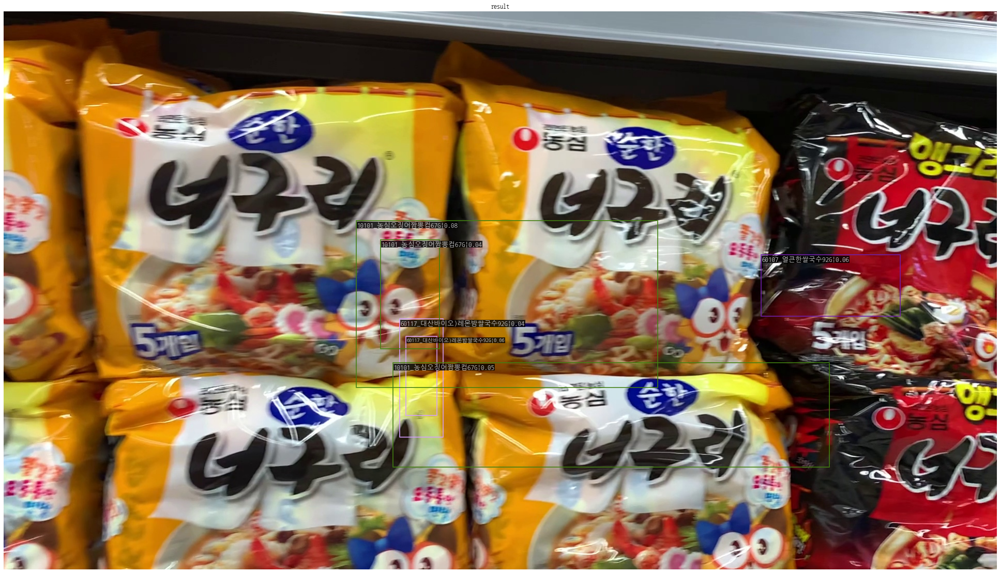

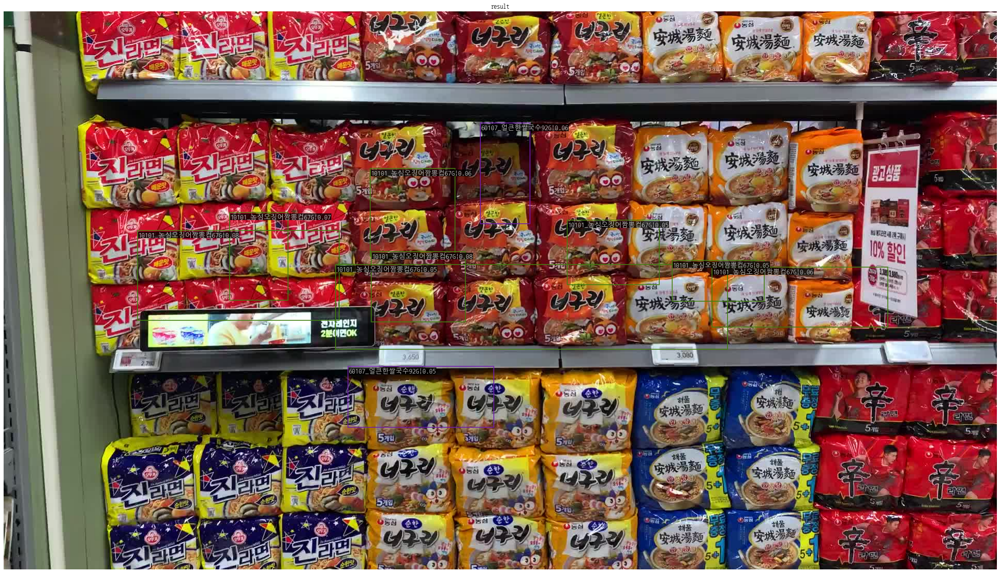

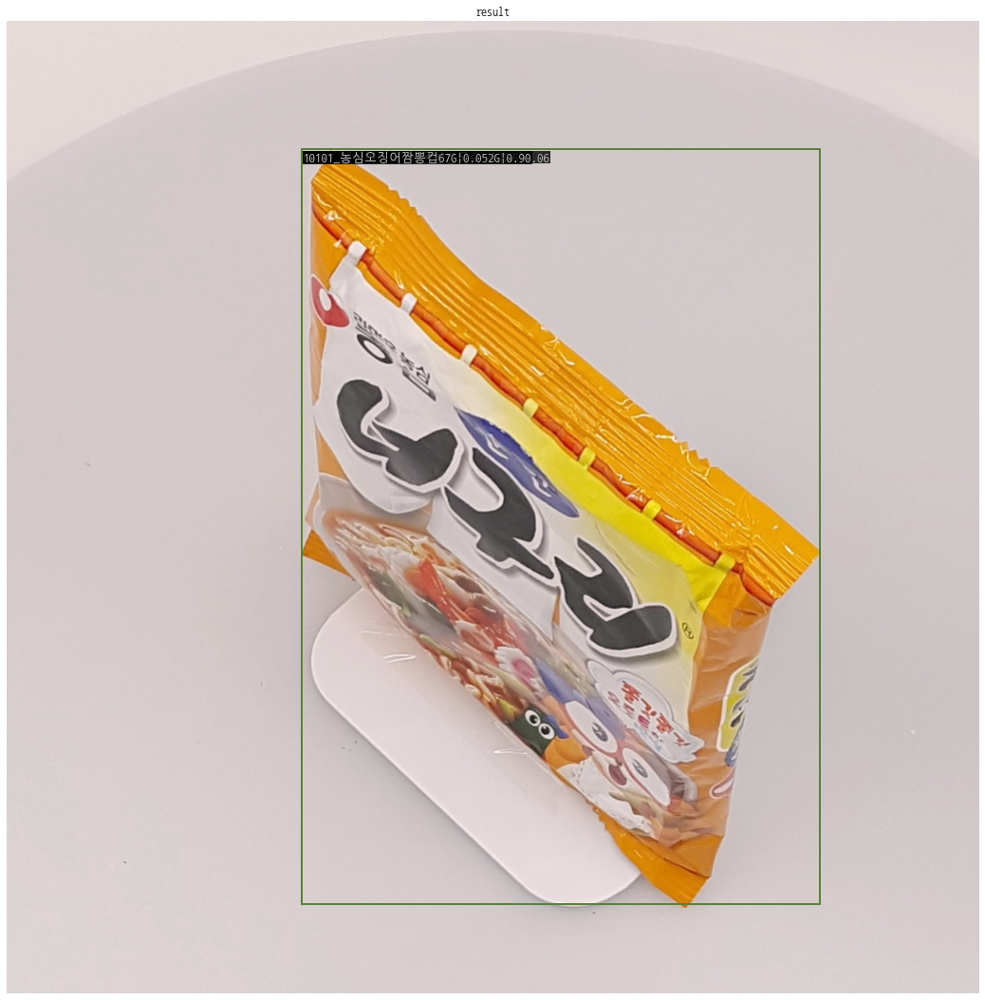

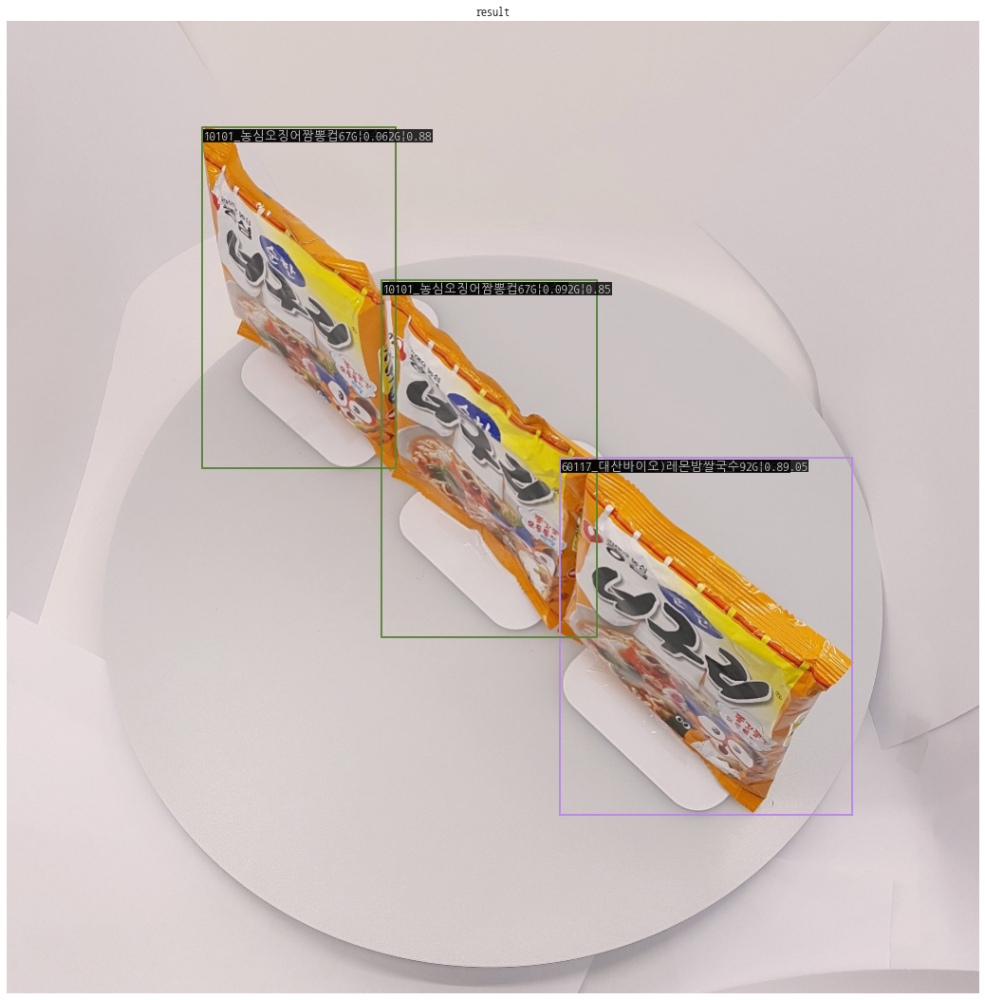

In [5]:
results = inference_img(config_file, ckpt_file, img_path, score_thr=0.04)

In [44]:
[[bbox for bbox in bboxes if bbox[4] > 0.01] for bboxes in [r for r in results[2] if len(r) > 0]]

[[],
 [array([3.1085477e+02, 1.3554944e+02, 8.5600037e+02, 9.3081946e+02,
         1.3098808e-02], dtype=float32)],
 [array([3.1085477e+02, 1.3554944e+02, 8.5600037e+02, 9.3081946e+02,
         1.7889837e-02], dtype=float32)],
 [],
 [],
 [],
 [],
 [array([3.1085477e+02, 1.3554944e+02, 8.5600037e+02, 9.3081946e+02,
         3.5017531e-02], dtype=float32)],
 [],
 [],
 [],
 [array([3.1085477e+02, 1.3554944e+02, 8.5600037e+02, 9.3081946e+02,
         3.5538740e-02], dtype=float32)],
 [],
 [],
 [array([3.1085477e+02, 1.3554944e+02, 8.5600037e+02, 9.3081946e+02,
         3.2573301e-02], dtype=float32)],
 [array([3.1085477e+02, 1.3554944e+02, 8.5600037e+02, 9.3081946e+02,
         1.0879434e-02], dtype=float32)],
 [],
 [],
 [],
 [array([3.1085477e+02, 1.3554944e+02, 8.5600037e+02, 9.3081946e+02,
         1.8411344e-02], dtype=float32)],
 [],
 [],
 [],
 [array([3.1085477e+02, 1.3554944e+02, 8.5600037e+02, 9.3081946e+02,
         1.9169062e-02], dtype=float32)],
 [],
 [],
 [],
 [array([3.108547

In [ ]:
inference_video(config_file, ckpt_file, video_path)